# U-net: Classifying Atmospheric Layers With SAGE Transmission Profiles 

Andrew Liu (Last Modified: August 12, 2022)

Here is a 4-week long project on classifying atmospheric layers with SAGE transmission profiles using a U-net architecture convolutional neural network. The U-net was implemented using TensorFlow, and there is also a Principle Component Analysis (PCA) that is implemented using sklearn.

As of the last modification date, all code blocks are working without errors.

## Imports

In [60]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

from pathlib import Path
from itertools import combinations
from matplotlib.colors import SymLogNorm
from matplotlib.collections import LineCollection
 
import json
import re

import tensorflow as tf
import sklearn.decomposition as decomposition

%reload_ext autoreload
%autoreload 2
import ml

## Retrieve Data

### Data Path

The data path must be changed accordingly based on where the SAGE data is located.

In [61]:
path = Path('data')
sage = xr.open_mfdataset(path.glob('*.nc'))

### Filter Data

In [62]:
sage = sage.where((sage != sage.int_fill_value) & (sage != sage.flt_fill_value))

## Load JSON

In [63]:
with open('eventfilemod.json', 'r') as f:
    events = json.load(f)

## Form Dataset

Here, we begin to form the inputs to the U-net including specifying global variables and processing relevant SAGE data.

### Global Data

NUM_CLASS is the number of labels we have and is either 2, 3, or 4. If NUM_CLASS is 2, we are only classifying cloud or not cloud. If NUM_CLASS is 3, we add an additional label for NaN values. If NUM_CLASS is 4, we add a final label for aerosol layers. 

SHAPE specifies the dimension of the plot (in this case, we are working with 200 altitudes (0.5 km to 100.0 km in 0.5 km steps) and 87 wavelength channels). 

OUT_SHAPE is the dimension of the plot being processed by the U-net. Each dimension must be a power of two to ensure that the input shape matches the output shape of the U-net after downscaling and upscaling, and in this case, the powers of two for the dimensions of each U-net input are 256 and 128. 

In [64]:
NUM_CLASS = 4
SHAPE = (200, 87)
OUT_SHAPE = (256, 128)

### Custom Colormap

Here, we create a custom colormap to better visualize the predictions outputted from the U-net. Different colormaps are simply combined together to form a singular colormap. Changing NUM_CLASS automatically adjusts the custom colormap accordingly.

FUTURE WORK: Change the colormaps used as the way for visualizing the predictions changes.

In [65]:
colors1 = plt.cm.gist_heat(np.linspace(0., 1, 128))
colors2 = plt.cm.Greens(np.linspace(0, 1, 128))
colors3 = plt.cm.PiYG_r(np.linspace(0, 1, 128))

map_colors = (colors1, colors2, colors3)

colors = np.vstack(map_colors[0:NUM_CLASS - 1])
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)   

### Process Data

In [66]:
def lognorm(matrix):
    """Returns a symmetric log normed matrix of the input

    Parameters
    ----------
    matrix : array(s) of floats
        The matrix to perform a symmetric log norm on

    Returns
    -------
    array(s) of floats
        The symmetric log normed matrix
    """
    LINTHRESH = 1e-3

    m_abs = np.abs(matrix)
    m_sgn = np.sign(matrix)
    m_normed = m_sgn * np.log(m_abs / LINTHRESH)

    m_normed = (m_normed - np.nanmean(m_normed)) / np.nanstd(m_normed)
    
    return m_normed

In [67]:
def process_data(data_class='training'):
    """Returns the processed data, labels, time identifiers, and raw transmission profiles to be used for U-net

    Parameters
    ----------
    data_class : str, optional
        The class of data being processed, either 'training' or 'testing' (labels are only generated if the data class is 'training'), by default 'training'

    Returns
    -------
    list
        A list of four elements:
            data_, numpy array with processed channels with shape (time, altitude, wavelength, channels) where altitude and wavelength are padded.
            labels_, list of corresponding labels with shape (time, altitude, wavelength) where altitude and wavelength are padded.
            times_, list of time identifiers for the labels and data
            raw_data_, list of unmodified transmission profiles
    """
    data_, labels_, times_, raw_data_ = [], [], [], []
    for e in events[data_class]:
        # Get time of event
        time = e['time']
        times_.append(time)

        # Get transmission data matrix
        matrix = ml.getDataAsMatrix(time, sage)
        raw_data_.append(matrix)

        # Generate masks
        trop_alt_map = ml.trop_altGenerator(e, SHAPE, sage)   # This is a mask for the absolute difference from the tropopause altitude
        # unc_map = ml.uncGenerator(e, matrix, sage)            This is a mask for the uncertainty associated with each pixel

        # Generate label
        if data_class == 'training':
            label = ml.labelGenerator(e, matrix, SHAPE, NUM_CLASS)
            labels_.append(ml.padMatrix(label, OUT_SHAPE))

        # Log Transformation
        n_matrix = lognorm(matrix)

        # Generate horizontal and vertical gradients
        gradient = np.array(np.gradient(matrix))
        vert_gradient, hor_gradient = lognorm(gradient[0]), lognorm(gradient[1])
        ml.deNaN(vert_gradient, False)
        ml.deNaN(hor_gradient, False)

        # Remove NaN values
        ml.deNaN(matrix, False)
        ml.deNaN(n_matrix, False)

        # Add any plots to the list to treat as channels
        # For instance, currently the original transmission profile (without NaN values) and the tropopause altitude mask are being used as 
        # channels (alongside the PCA inverse transformed plots generated below)
        stack = np.dstack(ml.padAll([matrix, trop_alt_map], OUT_SHAPE))
        data_.append(stack)

    # PCA Part
    N_COMPONENTS = 6                # Number of principle axes

    data_, raw_data_ = np.array(data_), np.array(raw_data_)
    op_data_ = np.moveaxis(raw_data_, 2, 0)
    n_inputs, dim_0, dim_1 = op_data_.shape

    # Reshape and center the transmission profiles
    reshape_data = op_data_.reshape(n_inputs, dim_0 * dim_1)
    centered_data = reshape_data - reshape_data.mean(axis=0)
    centered_data -= centered_data.mean(axis=1).reshape(n_inputs, -1)

    # Fit the PCA
    estimator = decomposition.PCA(n_components=N_COMPONENTS, svd_solver='auto')
    estimator.fit(centered_data)

    # Reduce dimensionality of input using transform(), then inverse transform back to original dimensions
    est_data_ = estimator.inverse_transform(estimator.transform(centered_data))

    # Shift each inverse transformed plot by the minimum value to remove any negative values, then scale
    # the plot so that the maximum value is 1
    est_data_ += np.abs(np.min(est_data_, axis=1)).reshape(n_inputs, -1) 
    est_data_ *= 1 / np.max(est_data_, axis=1).reshape(n_inputs, -1)
    
    # Reshape and pad the inverse transformed plots
    est_data_ = est_data_.reshape(n_inputs, dim_0, dim_1)
    est_data_ = np.moveaxis(est_data_, 0, 2)
    est_data_ = np.array(ml.padAll(est_data_, OUT_SHAPE))

    # Add the inverse transformed plots as a channel for the U-net to use
    data_ = np.concatenate((data_, est_data_[:, :, :, np.newaxis]), axis=3)

    # Return the data, labels, identifiers in the form of time, and the raw/unprocessed transmission profiles
    return [data_, labels_, times_, raw_data_]

In [68]:
data_, labels_, times_, raw_data_ = process_data()

C:\Users\Liu\AppData\Local\Temp\ipykernel_11916\3287322324.py:18: RuntimeWarning: divide by zero encountered in log
  m_normed = m_sgn * np.log(m_abs / LINTHRESH)
C:\Users\Liu\AppData\Local\Temp\ipykernel_11916\3287322324.py:18: RuntimeWarning: invalid value encountered in multiply
  m_normed = m_sgn * np.log(m_abs / LINTHRESH)


Here is a code block for visualizing the processed data. The left plot is for the specified channel and data index, the middle plot defaults to the first channel (in this case the transmission profile), and the right plot is the corresponding label.

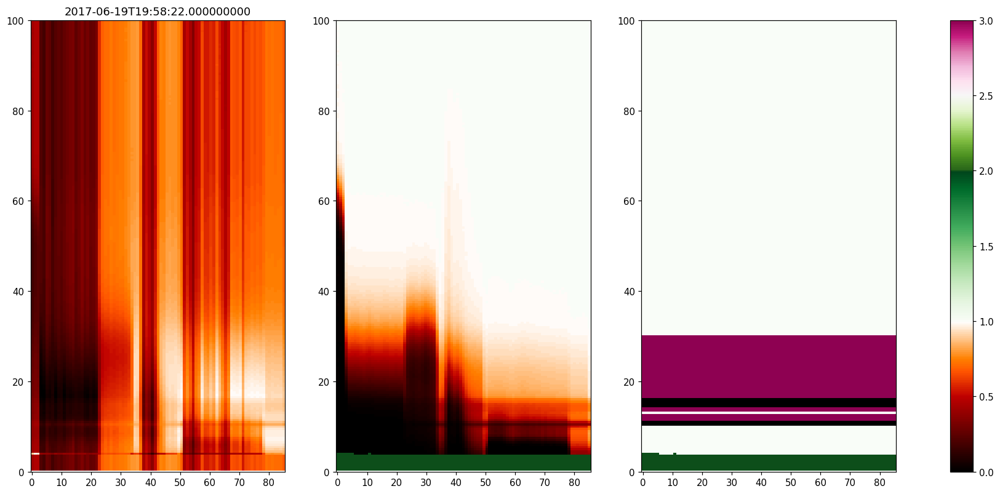

In [69]:
index, channel = 5, 2

f, ax = plt.subplots(1, 3, figsize=(21, 9), dpi=108)
#im = ax.imshow(data_[index, :, :, channel], vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap=mymap)
im = ax[0].imshow(ml.truncMatrix(data_[index, :, :, channel], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap=mymap)
#im = ax.imshow(ml.truncMatrix(labels_[index], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap=mymap)

ax[1].imshow(ml.truncMatrix(data_[index, :, :, 0], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap=mymap)
ax[2].imshow(ml.truncMatrix(labels_[index], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap=mymap)

for a in ax:
    a.set_ylim(0, 100)

ax[0].set_title(f'{times_[index]}')

f.colorbar(im, ax=ax)

### Experimentation With Principle Component Analysis

Here is a separate section of the code for experimenting with PCA. It is largely the same as the PCA section in the function process_data. I note that prior to fitting the PCA, the plots are manually centered (subtracting means). I also note that numpy's moveaxis is used to change the dimensions from (time, altitude, wavelength) to (wavelength, time, altitude). This is so that the PCA performs dimension reduction across wavelength instead of time.

In [70]:
N_COMPONENTS_T = 6

nraw_data_ = np.moveaxis(raw_data_, 2, 0)
n_inputs, dim_0, dim_1 = nraw_data_.shape

reshape_data = nraw_data_.reshape(n_inputs, dim_0 * dim_1)
centered_data = reshape_data - reshape_data.mean(axis=0)
centered_data -= centered_data.mean(axis=1).reshape(n_inputs, -1)

#pca = decomposition.PCA(n_components=n_components, svd_solver='randomized')
pca = decomposition.PCA(n_components=N_COMPONENTS_T, svd_solver='auto')
pca_data_ = pca.inverse_transform(pca.fit_transform(centered_data))

pca_data_ += np.abs(np.min(pca_data_, axis=1)).reshape(n_inputs, -1)
pca_data_ *= 1 / np.max(pca_data_, axis=1).reshape(n_inputs, -1)
pca_data_ = pca_data_.reshape(n_inputs, dim_0, dim_1)
var_data = pca.noise_variance_


Here is a visualization of the total explained variance curve from the above PCA. The leftmost dotted line signifies that the total explained variance first exceeds 90% at 3 components/principle axes. The rightmost dotted line signifies that the knee of the total explained variance curve is achieved at approximately 6 components.

FUTURE WORK: Determine the 'ideal' number of principle axes

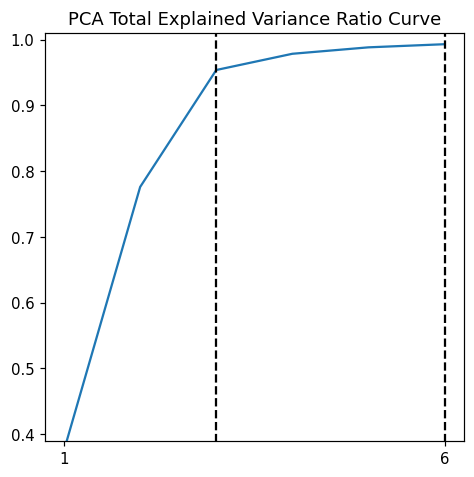

In [71]:
f, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=108)

x = np.array(range(N_COMPONENTS_T)) + 1
y = np.array(pca.explained_variance_ratio_) * -1 + 1

ax.plot(x, y)
ax.vlines(6, ymin=-0.2, ymax=1.2, linestyle='--', color='black')
ax.vlines(3, ymin=-0.2, ymax=1.2, linestyle='--', color='black')

ax.set_title('PCA Total Explained Variance Ratio Curve')
ax.set_ylim((0.39, 1.01))
ax.set_xticks(range(1, N_COMPONENTS_T + 1, 5));

Here is a visualization of the PCA's principle axes. Specify ROW and COL as needed to see the principle axes as needed.

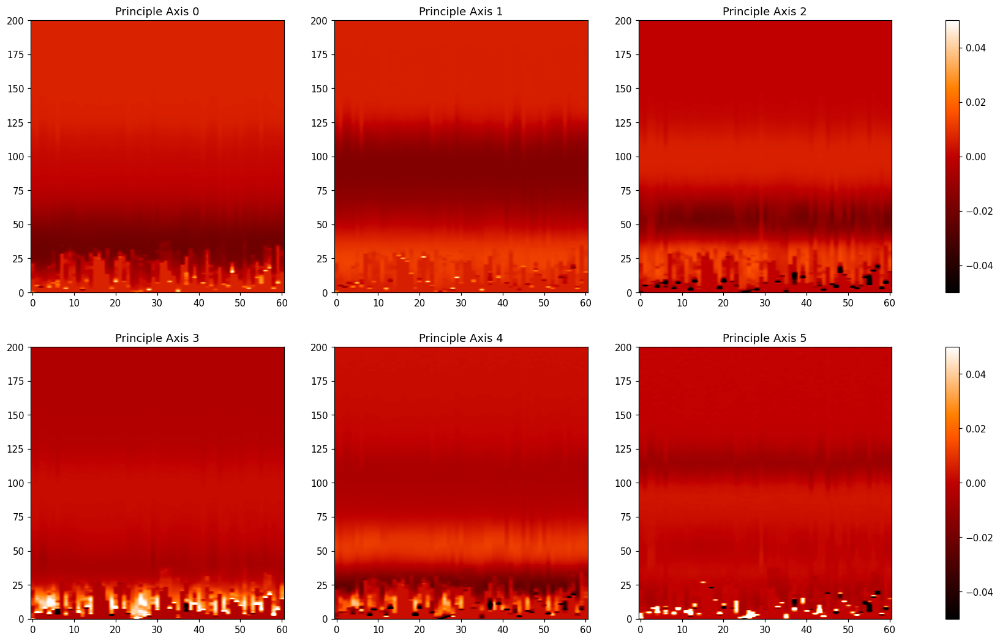

In [72]:
ROW, COL = 2, 3

#plot_data = pca.inverse_transform(pca.transform(centered_data)).reshape(N_COMPONENTS_T, dim_0, dim_1)
p_axes = np.moveaxis(pca.components_.reshape(N_COMPONENTS_T, dim_0, dim_1), 1, 2)

f, ax = plt.subplots(ROW, COL, figsize=(21, 6*ROW), dpi=108)
k = 0
for i in range(ROW):
    for j in range(COL):
        a = ax[i, j]
        if k < len(p_axes):
            im = a.imshow(p_axes[k], vmin=-0.05, vmax=0.05, aspect='auto', origin='lower', cmap='gist_heat')
        
        a.set_ylim(0, 200)
        a.set_title(f'Principle Axis {k}')
        k += 1
    
    f.colorbar(im, ax=ax[i])

f.savefig('plots/AL_paxes.jpeg', bbox_inches='tight')

Here is another way to visualize the principle axes.

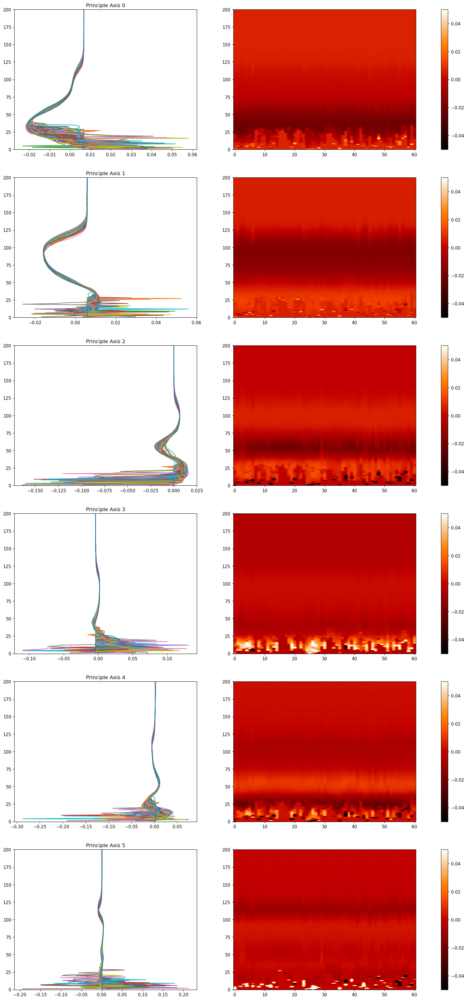

In [73]:
ROW, COL = N_COMPONENTS_T, 2

p_axes = np.moveaxis(pca.components_.reshape(N_COMPONENTS_T, dim_0, dim_1), 1, 2)

f, ax = plt.subplots(ROW, COL, figsize=(21, 7*ROW), dpi=108)

for i in range(N_COMPONENTS_T):
    ax[i, 0].set_title(f'Principle Axis {i}')
    im = ax[i, 0].plot(p_axes[i], range(1, 201))
    #ax.set_xlim(-0.01, 0.01)
    ax[i, 0].set_ylim(0, 200)
    
    im = ax[i, 1].imshow(p_axes[i], vmin=-0.05, vmax=0.05, aspect='auto', origin='lower', cmap='gist_heat')
    ax[i, 1].set_ylim(0, 200)
    f.colorbar(im, ax=ax[i])


Here is a visualization of the transmission profiles and the corresponding inverse transformed dimension reduced plot on the right (only the first ten plots are shown for the sake of space).

FUTURE WORK: Currently when processing the data, each transmission profile is manually centered before being used to fit the PCA. This means that sklearn's PCA does not automatically save and add the correct original mean following the inverse transformations. Explore manually re-adding the means after inverse transforming, or better yet, explore implementing an sklearn pipeline with a StandardScaler and PCA.

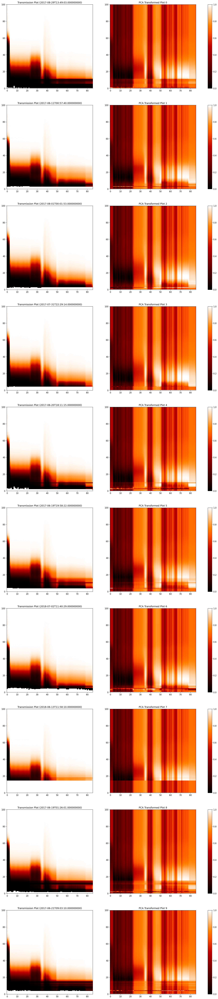

In [74]:
ROW, COL = 10, 2

plot_data = np.moveaxis(pca_data_, 0, 2)

f, ax = plt.subplots(ROW, COL, figsize=(21, 9*ROW), dpi=108)
for i in range(ROW):
    im = ax[i, 0].imshow(raw_data_[i], vmin=0, vmax=1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap='gist_heat')
        
    ax[i, 0].set_ylim(0, 100)
    ax[i, 0].set_title(f'Transmission Plot ({times_[i]})')

    ax[i, 1].imshow(plot_data[i], vmin=0, vmax=1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap='gist_heat')
        
    ax[i, 1].set_ylim(0, 100)
    ax[i, 1].set_title(f'PCA Transformed Plot {i}')
    
    f.colorbar(im, ax=ax[i])

Here is a way to visualize all inverse transformed plots without the corresponding unmodified transmission profile.

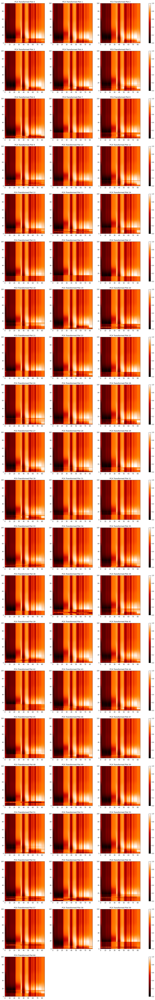

In [75]:
ROW, COL = 21, 3

#plot_data = pca.inverse_transform(pca.transform(centered_data)).reshape(N_COMPONENTS_T, dim_0, dim_1)
#plot_data = np.transpose(pca_data_, (2, 1, 0))
plot_data = np.moveaxis(pca_data_, 0, 2)

f, ax = plt.subplots(ROW, COL, figsize=(21, 6*ROW), dpi=108)
k = 0
for i in range(ROW):
    for j in range(COL):
        a = ax[i, j]
        
        if k < len(plot_data):
            #scale_plot = np.gradient(plot_data[k])[0]
            #scale_plot *= 1 / np.max(scale_plot)
            scale_plot = plot_data[k]
            im = a.imshow(scale_plot, vmin=0, vmax=1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap='gist_heat')
        
            a.set_ylim(0, 100)
            a.set_title(f'PCA Transformed Plot {k}')

            k += 1
        else:
            f.delaxes(a)
    
    f.colorbar(im, ax=ax[i])

Here is another way to visualize a single transmission profile and corresponding inverse transformed plot by specifying an index.

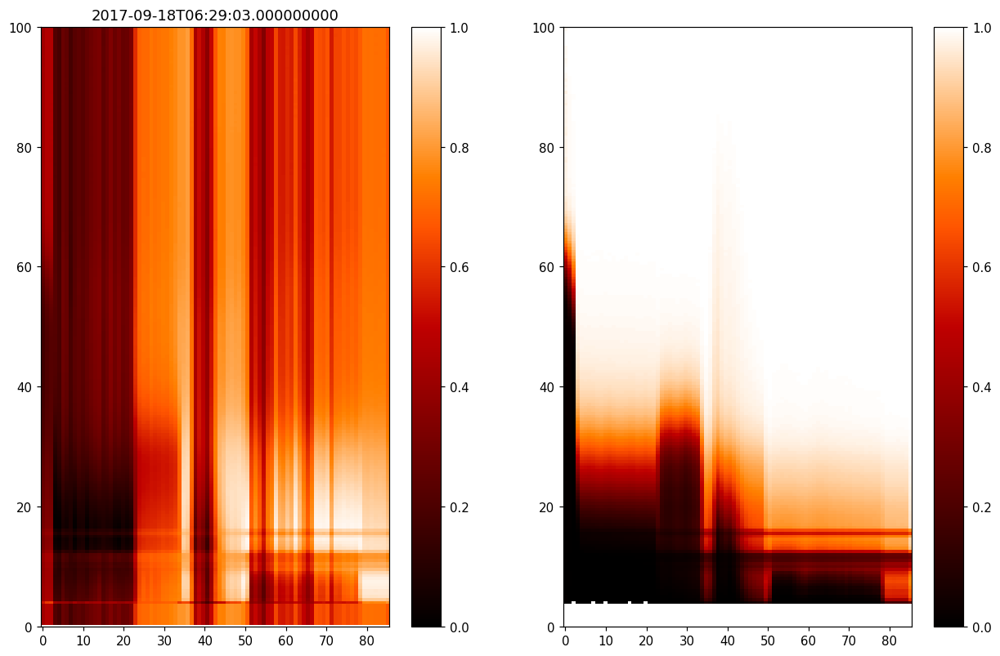

In [76]:
index = 30

f, ax = plt.subplots(1, 2, figsize=(14, 9), dpi=108)
im1 = ax[0].imshow(plot_data[index], vmin=0, vmax=1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap='gist_heat')
im2 = ax[1].imshow(raw_data_[index], vmin=0, vmax=1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap='gist_heat')
#im2 = ax[1].imshow(ml.truncMatrix(labels_[index], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap=mymap)

for a in ax:
    a.set_ylim(0, 100)

ax[0].set_title(f'{times_[index]}')

f.colorbar(im1, ax=ax[0])
f.colorbar(im2, ax=ax[1])

### Back to Data Processing

Here, we shuffle the data, labels, and time identifiers using a seed, then split them into training datasets and validation datasets for the U-net to use.
The validation split is currently 20%, so about 20% of all available data is used for validation and 80% is used for training.

In [77]:
SEED = 2000
tf.random.shuffle(data_, seed=SEED)
tf.random.shuffle(labels_, seed=SEED)
tf.random.shuffle(times_, seed=SEED)

val_split = 0.2
split_index = len(data_) - int(np.ceil(len(data_) * val_split))

train_data = np.array(data_[:split_index]).astype("float32")
train_labels = np.array(labels_[:split_index]).astype("float32")
train_times = times_[:split_index]

val_data = np.array(data_[split_index:]).astype("float32")
val_labels = np.array(labels_[split_index:]).astype("float32")
val_times = times_[split_index:]

In [78]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_data, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_data, val_labels))

In [79]:
BATCH_SIZE = 2
SHUFFLE_BUFFER_SIZE = 16

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
val_dataset = val_dataset.batch(BATCH_SIZE)

## U-net Initialization and Training

Here, we initialize the model based on the shape of the data (which is in (altitude, wavelength, channel) dimensions) and the number of classes. As more channels and/or labels are added, create_unet should initialize the model with the changes accordingly. The model is a slightly modified version of the U-net model implemented in https://keras.io/examples/vision/oxford_pets_image_segmentation/.

FUTURE WORK: Implement a U-net with dimensions (time, 1, altitude, wavelength + channels) or another similar dimension. Essentially, we want wavelength to be channels instead of another dimension.

In [80]:
model = ml.create_unet(data_.shape[1:], NUM_CLASS)

In [81]:
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

In [82]:
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=30
)

Epoch 1/30
24/24 [==============================] - 6s 134ms/step - loss: 0.8998 - accuracy: 0.8805 - val_loss: 1.4496 - val_accuracy: 0.4290
Epoch 2/30
24/24 [==============================] - 2s 103ms/step - loss: 0.1547 - accuracy: 0.9506 - val_loss: 1.9851 - val_accuracy: 0.4272
Epoch 3/30
24/24 [==============================] - 2s 102ms/step - loss: 0.1075 - accuracy: 0.9606 - val_loss: 2.0006 - val_accuracy: 0.4289
Epoch 4/30
24/24 [==============================] - 2s 102ms/step - loss: 0.0902 - accuracy: 0.9654 - val_loss: 2.1082 - val_accuracy: 0.4304
Epoch 5/30
24/24 [==============================] - 2s 102ms/step - loss: 0.0749 - accuracy: 0.9704 - val_loss: 2.2961 - val_accuracy: 0.4325
Epoch 6/30
24/24 [==============================] - 2s 102ms/step - loss: 0.0762 - accuracy: 0.9685 - val_loss: 2.1903 - val_accuracy: 0.4407
Epoch 7/30
24/24 [==============================] - 2s 103ms/step - loss: 0.0717 - accuracy: 0.9725 - val_loss: 1.9691 - val_accuracy: 0.4421
Epoch 

### Model Performance Plot

Here, we visualize the training and validation accuracies as a function of the epoch. To change the y limits, adjust the function plot_perf in the ml module.

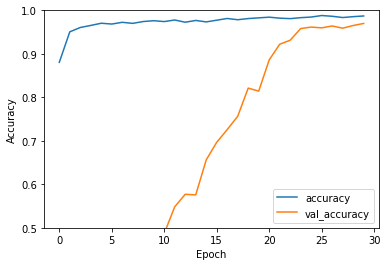

In [83]:
ml.plot_perf(history)

## Model Predictions

### Predictions For Validation Data

Here, the model makes predictions on the validation dataset.

In [84]:
predictions = np.array(model.predict(val_data))

1/1 [==============================] - 1s 1s/step


And we are able to visualize the data channel (by specifying the CHANNEL variable), the true label generated during data processing, and a visualization of the label predicted by the U-net on the right. 

Since U-net actually uses softmax, there is a probability of a pixel belonging to a specific label class for each class (in this case, I am using 4 labels, so there are 4 probabilities, and the sum of all of these probabilities is 1 for each pixel). I am then taking the maximum probability and shifting the value up accordingly based on the color scale. So, I have set up the visualization of the label as 0 (black) indicates cloud, 1 (white) indicates other, 2 (green) indicates NaN value, and 3 (magenta) indicates aerosol.

Because of the way I am visualizing the output of the U-net, it is disingenuous to have the custom colormap as a stack of 3 colormaps that seem to form a continuum when the values are not really a continuum, which is why another way of visualizing the output of the U-net must be explored.

FUTURE WORK: Explore other ways of visualizing the output of the U-net that is not simply taking the maximum of the probabilities and scaling the value up accordingly based on the colormap.

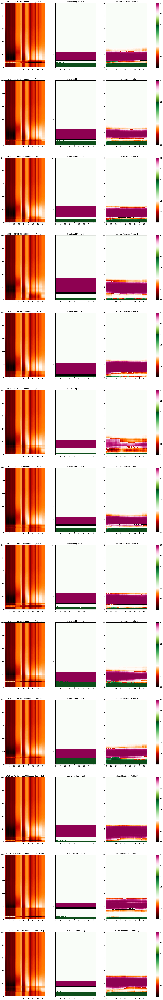

In [85]:
NUM_VAL = len(val_data)
COLOR_MAP = mymap
CHANNEL = 2

val_classified_outputs = ml.multiclassifier(predictions, NUM_CLASS)

f, ax = plt.subplots(NUM_VAL, 3, figsize=(21, 9 * NUM_VAL), dpi=108)
f.subplots_adjust(left=0.05, bottom=0.05, right=0.90, top=0.90, wspace=0.25)
#cax = f.add_axes([0.925, 0.05, 0.025, 0.85])

for i in range(NUM_VAL):
    ax[i, 0].imshow(ml.truncMatrix(val_data[i, :, :, CHANNEL], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], 
        origin='lower', cmap=COLOR_MAP)
    ax[i, 0].set_title(f'{val_times[i]} [Profile {i}]')

    ax[i, 1].imshow(ml.truncMatrix(val_labels[i], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], origin='lower', cmap=COLOR_MAP)
    ax[i, 1].set_title(f'True Label [Profile {i}]')
    
    #ml.truncMatrix(val_classified_outputs[i], SHAPE)
    #ml.truncMatrix(predictions[i, :, :, 1], SHAPE)
    im = ax[i, 2].imshow(ml.truncMatrix(val_classified_outputs[i], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], 
        origin='lower', cmap=COLOR_MAP)
    
    ax[i, 2].set_title(f'Predicted Features [Profile {i}]')

    for j in [0, 1, 2]:
        ax[i, j].set_ylim(0, 100)

    f.colorbar(im, ax=ax[i])
#f.colorbar(im, cax=cax)

In [86]:
def mmmGenerator(output):
    """Returns the mean, median, and maximum for each altitude across all wavelengths for a predicted label

    Parameters
    ----------
    output : 2d array of floats
        A predicted label with visualization transformation applied

    Returns
    -------
    list
        A list of three elements:
            v_mean, numpy array of means across all wavelengths for each altitude
            v_median, numpy array of medians across all wavelengths for each altitude
            v_max, numpy array of maximums across all wavelengths for each altitude
    """
    v = ml.truncMatrix(output, SHAPE)
    v_max = np.max(v, axis=1)
    v_mean = np.mean(v, axis=1)
    v_median = np.median(v, axis=1)

    return [v_mean, v_median, v_max]

Here is another way of visualizing the predicted labels as line plots. The dotted line in the mean, median, and maximum plot indicates the true label and can be used as a reference for determining which line best fits the true label (based on my observations, it seems that the median generally fits the true label the best). 

The lines are multicolored based on the label value, and it is apparent that there are colored segments. The actual point/label value that dictates the color of an entire segment is final point of the segment (imagine tracing the line from top to bottom, then the last point that is traced on the color segment is the point that dictates the color of that segment). It is because of this reason that a better way for visualizing the predictions as altitude vs label should be explored.

FUTURE WORK: Potentially explore scatter plots or using markers to denote actual data plots to avoid the color segments

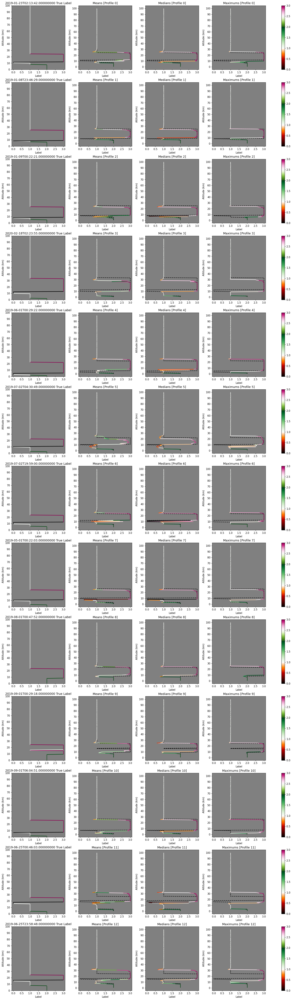

In [87]:
NUM_VAL = len(val_data)
COLOR_MAP = mymap

val_classified_outputs = ml.multiclassifier(predictions, NUM_CLASS)

f, ax = plt.subplots(NUM_VAL, 4, figsize=(21, 5 * NUM_VAL), dpi=108)
f.subplots_adjust(left=0.05, bottom=0.05, right=0.90, top=0.90, wspace=0.25)

linecolors = ['orange', 'blue', 'red', 'green']

for i in range(NUM_VAL):
    titles = [f'{val_times[i]} True Label', f'Means [Profile {i}]', f'Medians [Profile {i}]', f'Maximums [Profile {i}]']
    
    output_mmm = mmmGenerator(val_classified_outputs[i])
    true_label = np.median(ml.truncMatrix(val_labels[i], SHAPE), axis=1)

    y = (np.array(range(200)) + 1) * 0.5

    for j in [0, 1, 2, 3]:
        x = output_mmm[j-1] if j != 0 else true_label

        if j != 0: ax[i, j].plot(true_label, y, 'black', linestyle='--')
        #ax[i, j].plot(x, y, linecolors[j])
        #ax[i, j].scatter(x, y, s=8, c=x, cmap=mymap, marker='o')

        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        # Create a continuous norm to map from data points to colors
        norm = plt.Normalize(0, 3)
        lc = LineCollection(segments, cmap=mymap, norm=norm)
        # Set the values used for colormapping
        lc.set_array(x)
        lc.set_linewidth(2)
        line = ax[i, j].add_collection(lc)

        ax[i, j].set_title(titles[j])
        
        ax[i, j].set_yticks(range(0, 110, 10))
        ax[i, j].set_xlim(-0.1, NUM_CLASS - 0.9)

        #ax[i, j].axhline(0.5, linestyle=':', linewidth=3, color='black')

        ax[i, j].set_ylabel('Altitude (km)')
        ax[i, j].set_xlabel('Label')

        ax[i, j].set_facecolor('gray')
    
    f.colorbar(line, ax=ax[i])

### Predictions For Testing Data

Here, we have the same steps as above to visualize the U-net's predictions of the testing dataset (transmission profiles without labels). Note that when processing the training data, there are no labels, so we simply store the returned empty label list in _. 

In [88]:
testing_data, _, testing_times, testing_raw_data_ = process_data('testing')

C:\Users\Liu\AppData\Local\Temp\ipykernel_11916\3287322324.py:18: RuntimeWarning: divide by zero encountered in log
  m_normed = m_sgn * np.log(m_abs / LINTHRESH)
C:\Users\Liu\AppData\Local\Temp\ipykernel_11916\3287322324.py:18: RuntimeWarning: invalid value encountered in multiply
  m_normed = m_sgn * np.log(m_abs / LINTHRESH)


In [89]:
test_predictions = np.array(model.predict(testing_data))

1/1 [==============================] - 0s 121ms/step


We have the same visualization methods as the ones used for the validation dataset predictions, but there are no labels here.

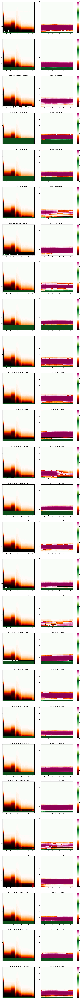

In [90]:
NUM_DATA = len(testing_data)
COLOR_MAP = mymap

test_classified_outputs = ml.multiclassifier(test_predictions, NUM_CLASS)

f, ax = plt.subplots(NUM_DATA, 2, figsize=(21, 9 * NUM_DATA), dpi=108)
for i in range(NUM_DATA):
    ax[i, 0].imshow(ml.truncMatrix(testing_data[i, :, :, 0], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], 
        origin='lower', cmap=COLOR_MAP)
    ax[i, 0].set_title(f'{testing_times[i]} [Profile {i}]')

    im = ax[i, 1].imshow(ml.truncMatrix(test_classified_outputs[i], SHAPE), vmin=0, vmax=NUM_CLASS - 1, aspect='auto', extent=[-0.5, 85.5, 0.25, 100.25], 
        origin='lower', cmap=COLOR_MAP)
    ax[i, 1].set_title(f'Predicted Features [Profile {i}]')

    for j in [0, 1]:
        ax[i, j].set_ylim(0, 100)

    f.colorbar(im, ax=ax[i])

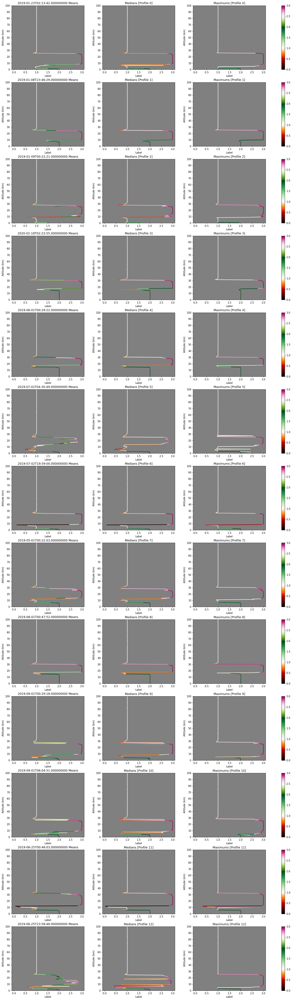

In [91]:
NUM_VAL = len(val_data)
COLOR_MAP = mymap

test_classified_outputs = ml.multiclassifier(test_predictions, NUM_CLASS)

f, ax = plt.subplots(NUM_VAL, 3, figsize=(21, 5 * NUM_VAL), dpi=108)
f.subplots_adjust(left=0.05, bottom=0.05, right=0.90, top=0.90, wspace=0.25)

for i in range(NUM_VAL):
    titles = [f'{val_times[i]} Means', f'Medians [Profile {i}]', f'Maximums [Profile {i}]']
    
    output_mmm = mmmGenerator(test_classified_outputs[i])

    y = (np.array(range(200)) + 1) * 0.5

    for j in [0, 1, 2]:
        x = output_mmm[j]
        #ax[i, j].plot(x, y, linecolors[j])
        #ax[i, j].scatter(x, y, s=8, c=x, cmap=mymap, marker='o')

        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        # Create a continuous norm to map from data points to colors
        norm = plt.Normalize(0, 3)
        lc = LineCollection(segments, cmap=mymap, norm=norm)
        # Set the values used for colormapping
        lc.set_array(x)
        lc.set_linewidth(2)
        line = ax[i, j].add_collection(lc)

        ax[i, j].set_title(titles[j])
        
        ax[i, j].set_yticks(range(0, 110, 10))
        ax[i, j].set_xlim(-0.1, 3.1)

        #ax[i, j].axhline(0.5, linestyle=':', linewidth=3, color='black')

        ax[i, j].set_ylabel('Altitude (km)')
        ax[i, j].set_xlabel('Label')

        ax[i, j].set_facecolor('gray')
    
    f.colorbar(line, ax=ax[i])

## Convolution Layer Visualization

### Filter Visualization

Here is a code block for visualizing the filters/kernels for the first convolutional layer.

FUTURE WORK: Find a way to visualize the filters in all convolutional layers and neatly present them in matplotlib subplots. 

conv2d (3, 3, 3, 32)


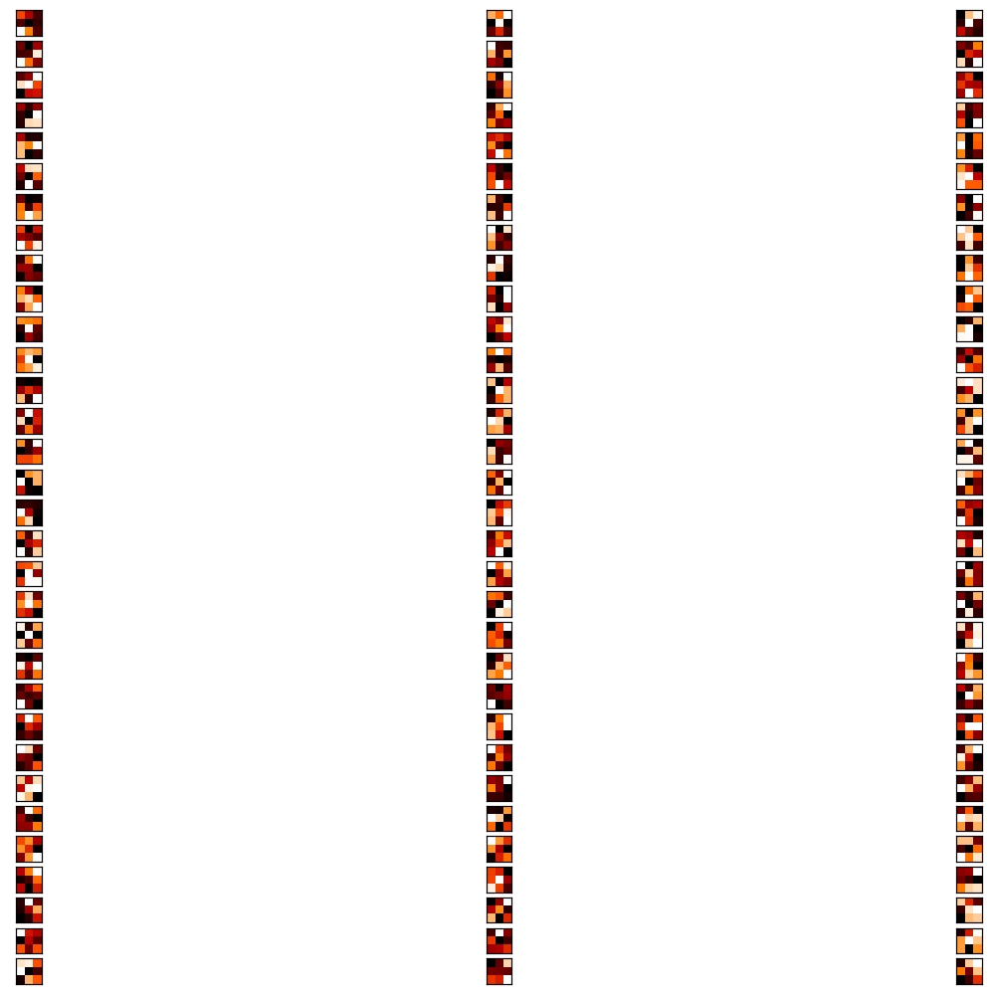

In [92]:
for layer in [model.layers[1]]:
    if 'conv' in layer.name:
        weights = layer.get_weights()[0]
        
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)
        print(layer.name, filters.shape)
        filter_cnt=1
        
        f, ax = plt.subplots(filters.shape[3], filters.shape[2], figsize=(16, 12), dpi=108)
        for i in range(filters.shape[-1]):
            filt=filters[:, :, :, i]

            for j in range(filters.shape[2]):
                ax[i, j].set_xticks([])
                ax[i, j].set_yticks([])
                ax[i, j].imshow(filt[:, :, j], cmap='gist_heat')

            filter_cnt+=1

### Feature Map Visualization

This code block prints all convolutional layers in the U-net with the layer number, layer name, and layer shape.

In [93]:
conv_blocks = []
for label_i in range(len(model.layers)):
    layer = model.layers[label_i]

    if 'conv' in layer.name and (re.compile('conv2d_\d').match(layer.name) or layer.name == 'conv2d'):
        print(label_i, layer.name, layer.output.shape)
        conv_blocks.append(label_i)
    
    label_i += 1

print(conv_blocks)

1 conv2d (None, 128, 64, 32)
11 conv2d_1 (None, 64, 32, 64)
20 conv2d_2 (None, 32, 16, 128)
29 conv2d_3 (None, 16, 8, 256)
39 conv2d_4 (None, 32, 16, 256)
49 conv2d_5 (None, 64, 32, 128)
59 conv2d_6 (None, 128, 64, 64)
69 conv2d_7 (None, 256, 128, 32)
71 conv2d_8 (None, 256, 128, 4)
[1, 11, 20, 29, 39, 49, 59, 69, 71]


Here, we can visualize a good number of feature maps from each convolutional layer in the U-net as it makes predictions for a single data input. To visualize other data inputs, change train_data[0] to another data input.

1/1 [==============================] - 1s 599ms/step


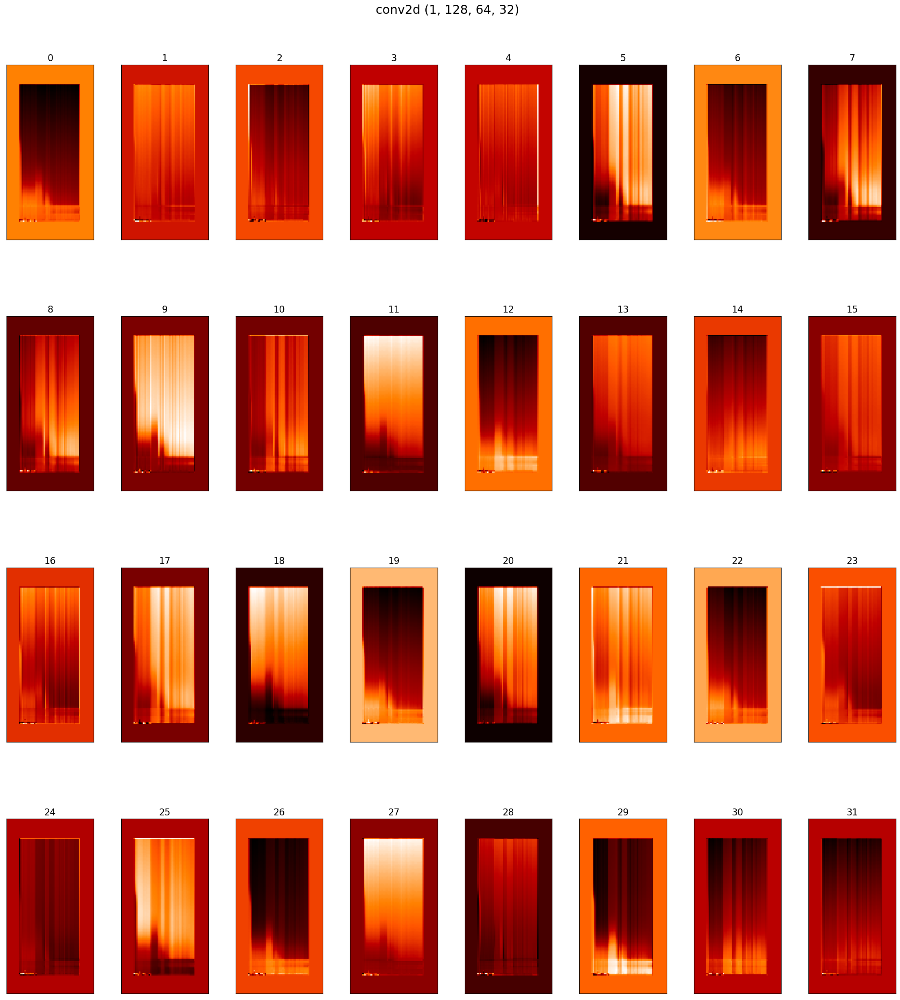

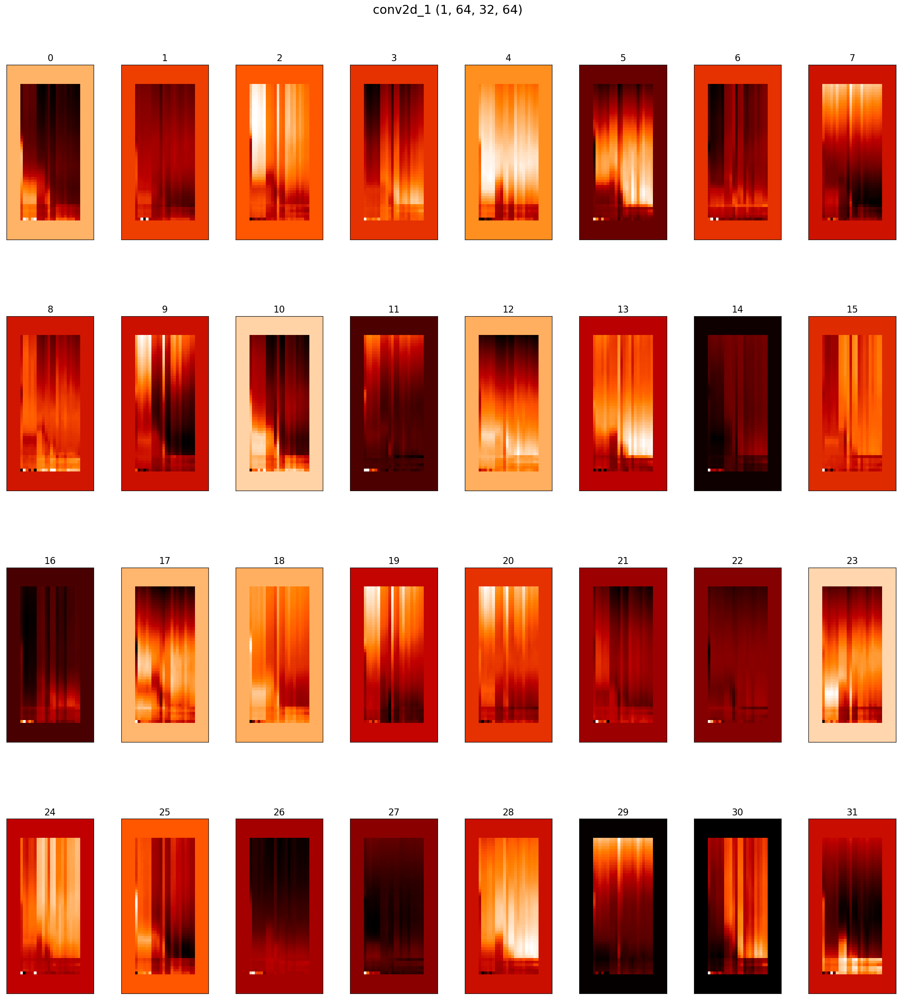

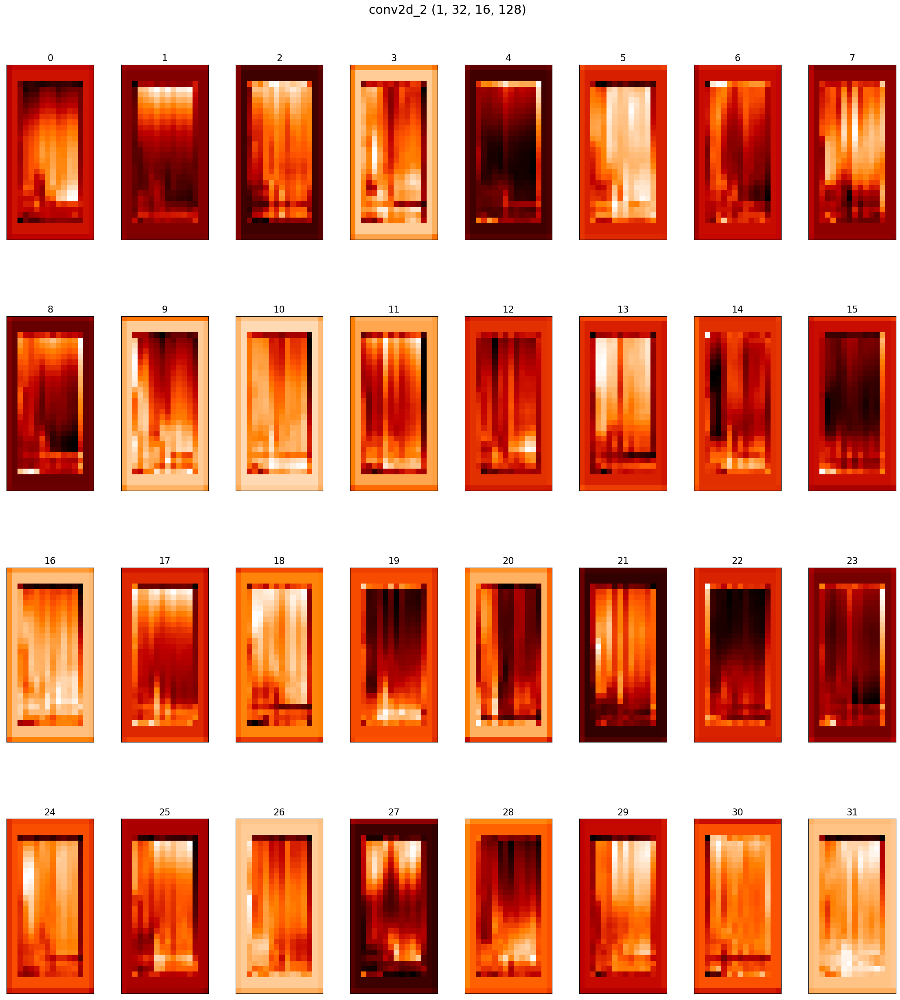

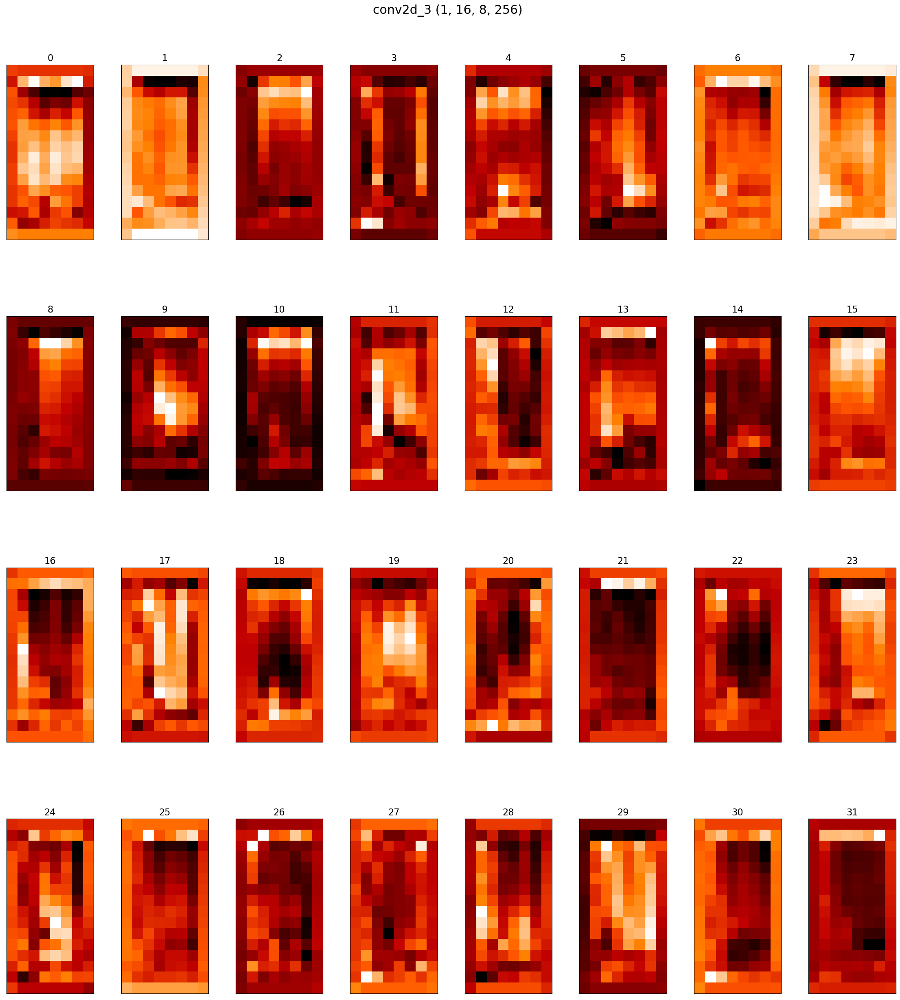

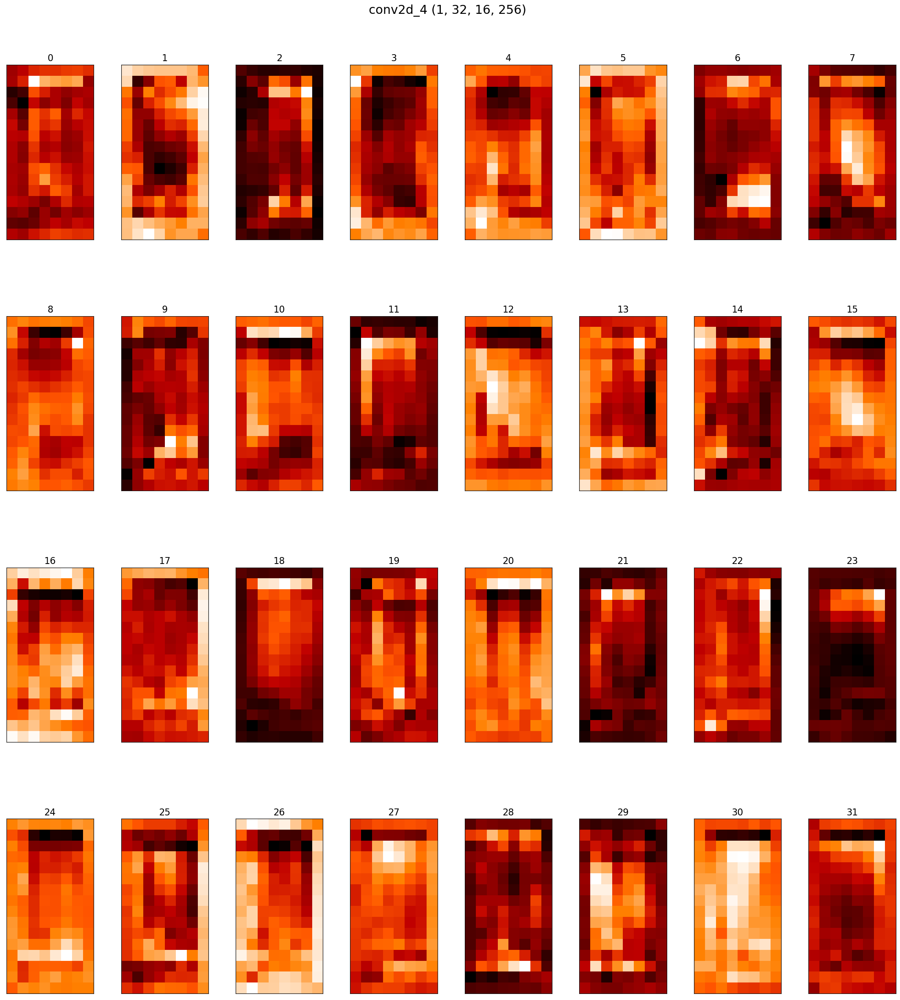

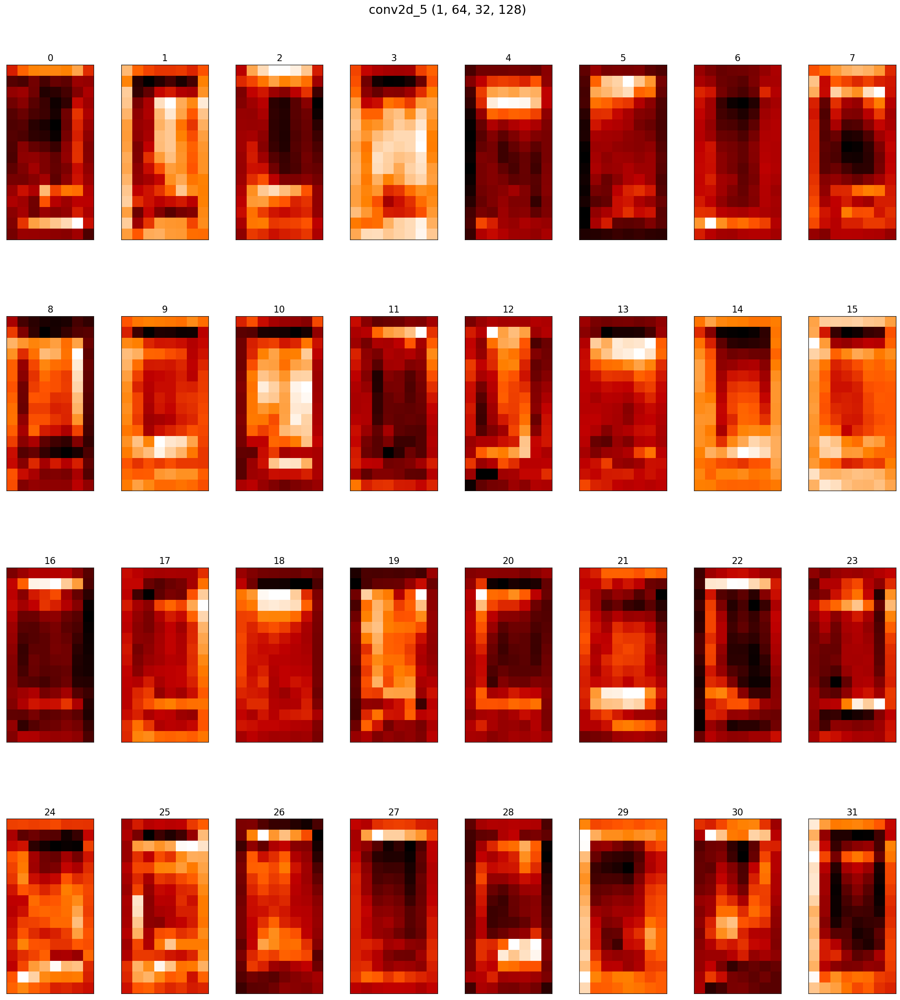

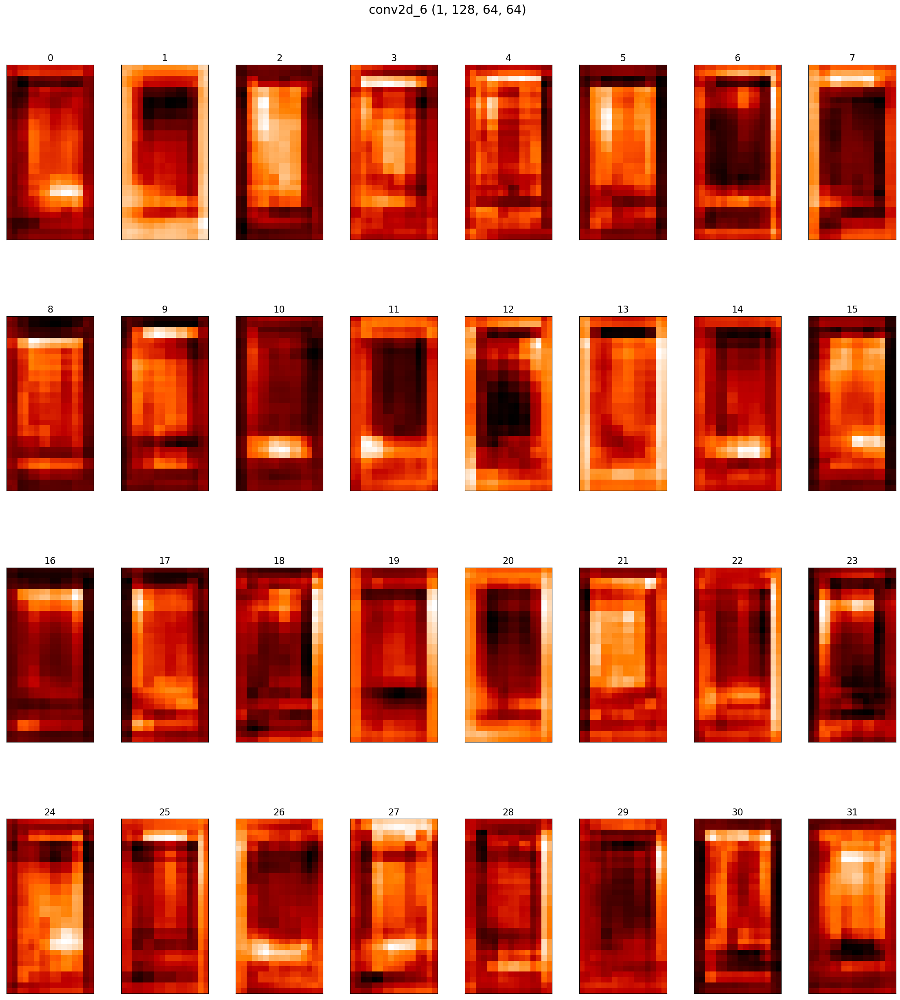

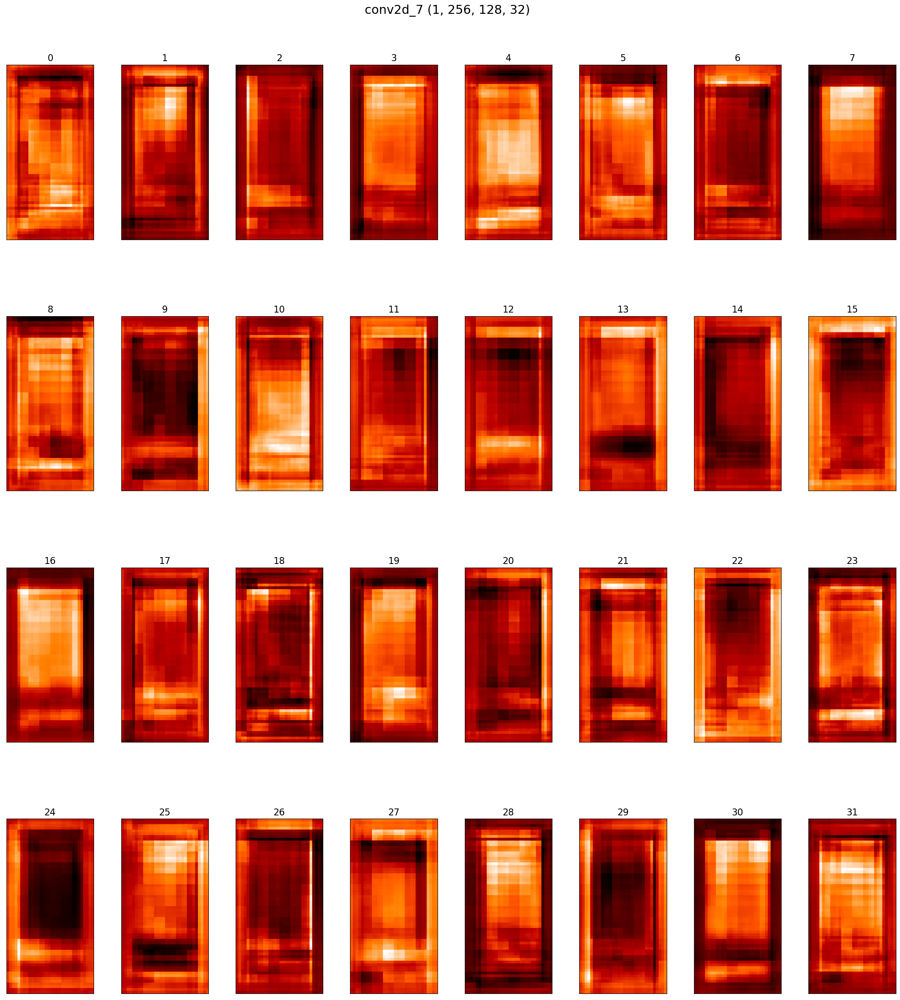

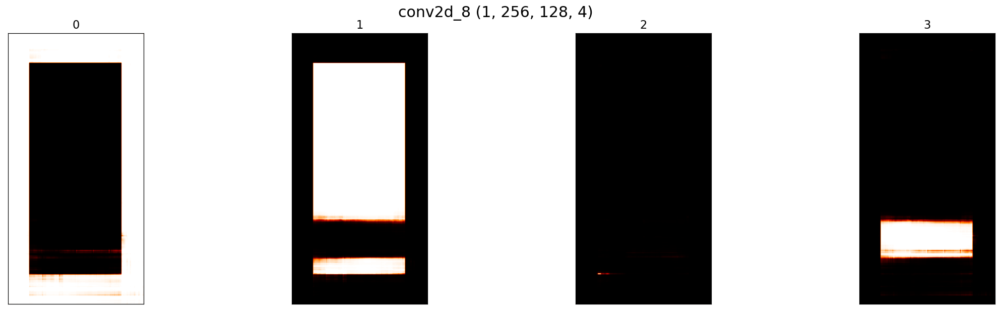

In [94]:
visual_data = np.expand_dims(train_data[0], axis=0)

outputs = [model.layers[i].output for i in conv_blocks]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = outputs)

feature_maps = visualization_model.predict(visual_data)

NUM_COLS = 8
NUM_ROWS = 4

iter = 0
for fmap in feature_maps[:-1]:
    ix = 1
    f, ax = plt.subplots(NUM_ROWS, NUM_COLS, figsize=(21, 6 * NUM_ROWS), facecolor='w', dpi=108)
    f.suptitle(f'{model.layers[conv_blocks[iter]].name} {fmap.shape}', size=20)
    f.tight_layout()
    f.subplots_adjust(top=0.95)
    for i in range(NUM_ROWS):
        for j in range(NUM_COLS):
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])
            ax[i][j].imshow(np.flipud(fmap[0, :, :, ix - 1]), cmap='gist_heat')
            ax[i][j].set_title(f'{i * NUM_COLS + j}', size=15)
            ix += 1
    iter += 1

NUM_ROWS = 1
NUM_COLS = NUM_CLASS

ix = 1
f, ax = plt.subplots(NUM_ROWS, NUM_COLS, figsize=(21, 6 * NUM_ROWS), facecolor='w', dpi=108)
f.suptitle(f'{model.layers[conv_blocks[iter]].name} {feature_maps[-1].shape}', size=20)
f.tight_layout()
for i in range(NUM_COLS):
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].imshow(np.flipud(feature_maps[-1][0, :, :, ix - 1]), cmap='gist_heat')
    ax[i].set_title(f'{i}', size=15)
    ix += 1